In [28]:
import numpy as np
import lmfit
import cv2 as cv
import feret
from matplotlib import pyplot as plt
from pathlib import Path
%matplotlib inline

In [29]:
grand_p = Path(".")
image_folder = grand_p / "image_to_process"
image_dirs = [d for d in image_folder.iterdir() if d.is_dir()]

In [30]:
def get_thresh_data(path):
    p = path
    img = cv.imread(str(p / "contrasted.tif"))
    gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
    gray = cv.GaussianBlur(gray,(5,5),cv.BORDER_DEFAULT)
#     plt.imshow(gray)
    # gray =  cv.convertScaleAbs(gray, alpha=0.9, beta=0.85)
#     plt.figure()
#     plt.imshow(gray)
    thresh = cv.adaptiveThreshold(gray,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,\
                cv.THRESH_BINARY,151,0)
    # ret, thresh = cv.threshold(gray,0,255,cv.THRESH_OTSU+cv.THRESH_BINARY_INV)
#     plt.figure()
#     plt.imshow(thresh)
    return thresh

In [31]:
def get_opening(thresh):
    kernel = np.ones((3,3),np.uint8)
    opening = cv.morphologyEx(thresh,cv.MORPH_OPEN,kernel, iterations = 2)
    return opening
def get_sure_bg(opening):
    kernel = np.ones((3,3),np.uint8)
    sure_bg = cv.dilate(opening,kernel,iterations=2)
    return sure_bg


In [32]:
def get_sure_fg(opening):
    kernel = np.ones((3,3),np.uint8)
    opening = cv.erode(opening, kernel, iterations=2)
    opening = cv.dilate(opening, kernel, iterations=2)
    dist_transform = cv.distanceTransform(opening,cv.DIST_L2,3)
    ret, sure_fg = cv.threshold(dist_transform,0.3*dist_transform.max(),255,0)
    sure_fg = np.uint8(sure_fg)
    return sure_fg

def get_unknown_region(sure_bg, sure_fg):
    unknown = cv.subtract(sure_bg,sure_fg)
    return unknown

In [33]:
def get_markers_watershed(path, sure_fg, unknown):
    p = path
    img = cv.imread(str(p / "contrasted.tif"))
    ret, markers = cv.connectedComponents(sure_fg)
    markers = markers+1
    markers[unknown==255] = 0
    markers = cv.watershed(img,markers)
    return markers
    

In [34]:
def get_non_contrast_image(path, markers):
    p = path
    kernel = np.ones((3,3),np.uint8)
    img_no_contrast = cv.imread(str(p / "no_contrasted.tif"))
#     img_no_contrast[markers == -1] = [255,0,0]
    img_no_contrast[cv.dilate(((markers == -1)*1).astype('uint8'),kernel,iterations=2)==1] = [255,0,0]
    return img_no_contrast

In [35]:
def collect_stat(markers):
    areas = []
    feret_data = []
    for i in range(2,np.max(markers)):
        try:
            if np.average(((markers==i))) == 0.0:
                print(f"no data {i}")
                continue
            feret_data.append(feret.all(markers==i))
            areas.append(np.sum(markers==i))
        except IndexError:
            print(i)
    feret_data_np = np.array(feret_data)
    pixel_sizes = np.sqrt(feret_data_np[:,0]**2 + feret_data_np[:,1]**2)
    all_areas = np.array(areas)
    nm_size = pixel_sizes * 2000 / 813 ## nm / pixels !!!!!!!!!!!!!!!!!!!!!
    return all_areas, nm_size

In [36]:
def merge_data_and_sort(all_areas, nm_size):
    merged_data = np.ones((all_areas.shape[0],2))
    merged_data[:,1] = all_areas
    merged_data[:,0] = nm_size
    sorted_by_radius = merged_data[merged_data[:, 0].argsort()]
    return sorted_by_radius

def split_data_into_bins(data: np.array, delta_r: int) -> list[np.array]:
    bins_n = int(np.ceil(np.max(data[:,0]) / delta_r))
    answer = []
    for i in range(bins_n):
        answer.append(data[(data[:,0] > i*delta_r) * (data[:, 0] < (i + 1) * delta_r)])
    return answer

def get_plot_data(areas, nm_size, delta_r):
    data = merge_data_and_sort(areas, nm_size)
    splited_data = split_data_into_bins(data, delta_r=delta_r)
    total_area = np.sum(data[:,1])
    x = [delta_r * (i + 1) for i in range(len(splited_data))]
    y = [np.sum(chunk[:,1]) / total_area for chunk in splited_data]
    data = np.array([[i, j] for i, j in zip(x,y)])
    return data

image_to_process\sample #1
no data 12
no data 16
no data 23
no data 716


C:\Users\maksi\anaconda3\lib\site-packages\feret\main.py:94: RuntimeWarning: invalid value encountered in divide
  ds = np.abs(np.cross(p2 - p1, p1 - self.hull.T) / norm(p2 - p1))


927
1057
no data 1205
no data 1320


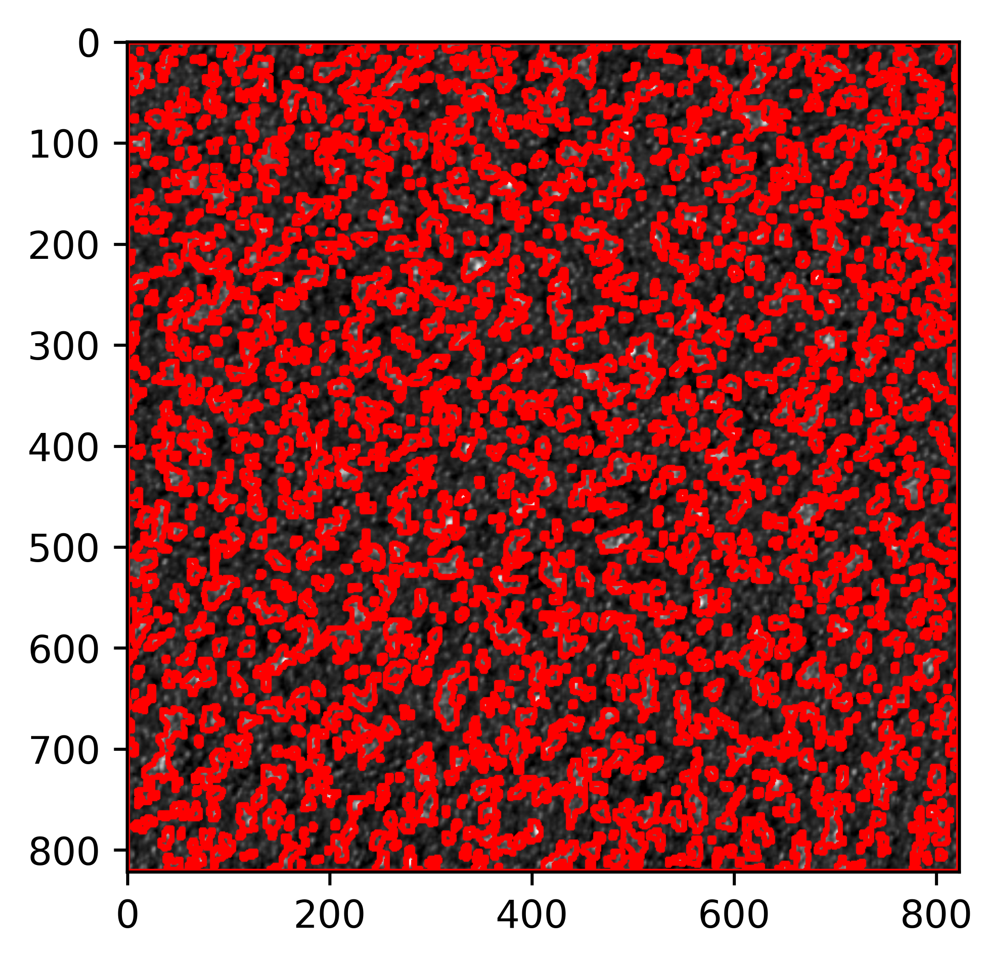

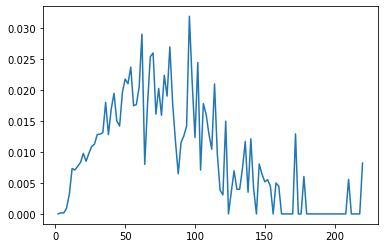

image_to_process\sample #2


C:\Users\maksi\anaconda3\lib\site-packages\feret\main.py:94: RuntimeWarning: invalid value encountered in divide
  ds = np.abs(np.cross(p2 - p1, p1 - self.hull.T) / norm(p2 - p1))


405
642
no data 765
857
no data 914
no data 1140
1188
1223
no data 1231
no data 1248
no data 1306


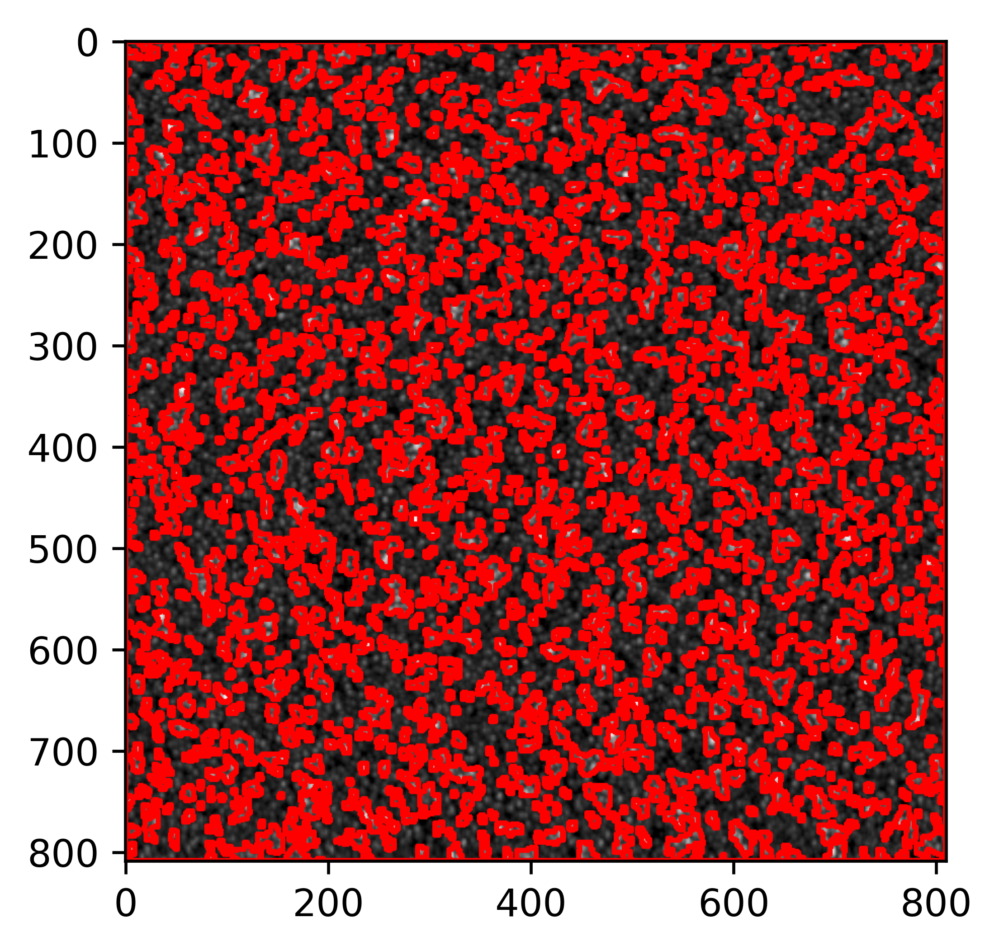

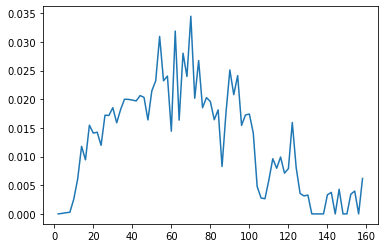

In [37]:
plot_dict = {}
radius_dist = {}
area_dist = {}
images_dict = {}
delta_r = 2 #nm
for image_dir in image_dirs:
    print(image_dir)
    thresh = get_thresh_data(image_dir)
    opening = get_opening(thresh)
    sure_bg = get_sure_bg(opening)
    sure_fg = get_sure_fg(opening)
    unknown = get_unknown_region(sure_bg, sure_fg)
    markers = get_markers_watershed(image_dir, sure_fg, unknown)
    img_no_contrast = get_non_contrast_image(image_dir, markers)
    areas, nm_size = collect_stat(markers)
    plot_data = get_plot_data(areas, nm_size, delta_r)
    plt.figure(dpi=600)
    plt.imshow(img_no_contrast)
    plt.show()
    plt.figure()
    plt.plot(plot_data[:,0], plot_data[:,1])
    plt.show()
    plot_dict[str(image_dir.name)] = plot_data
    radius_dist[str(image_dir.name)] = nm_size
    area_dist[str(image_dir.name)] = areas
    images_dict[str(image_dir.name)] = img_no_contrast



In [38]:
save_dir = grand_p / "results"
if not save_dir.exists():
    save_dir.mkdir()


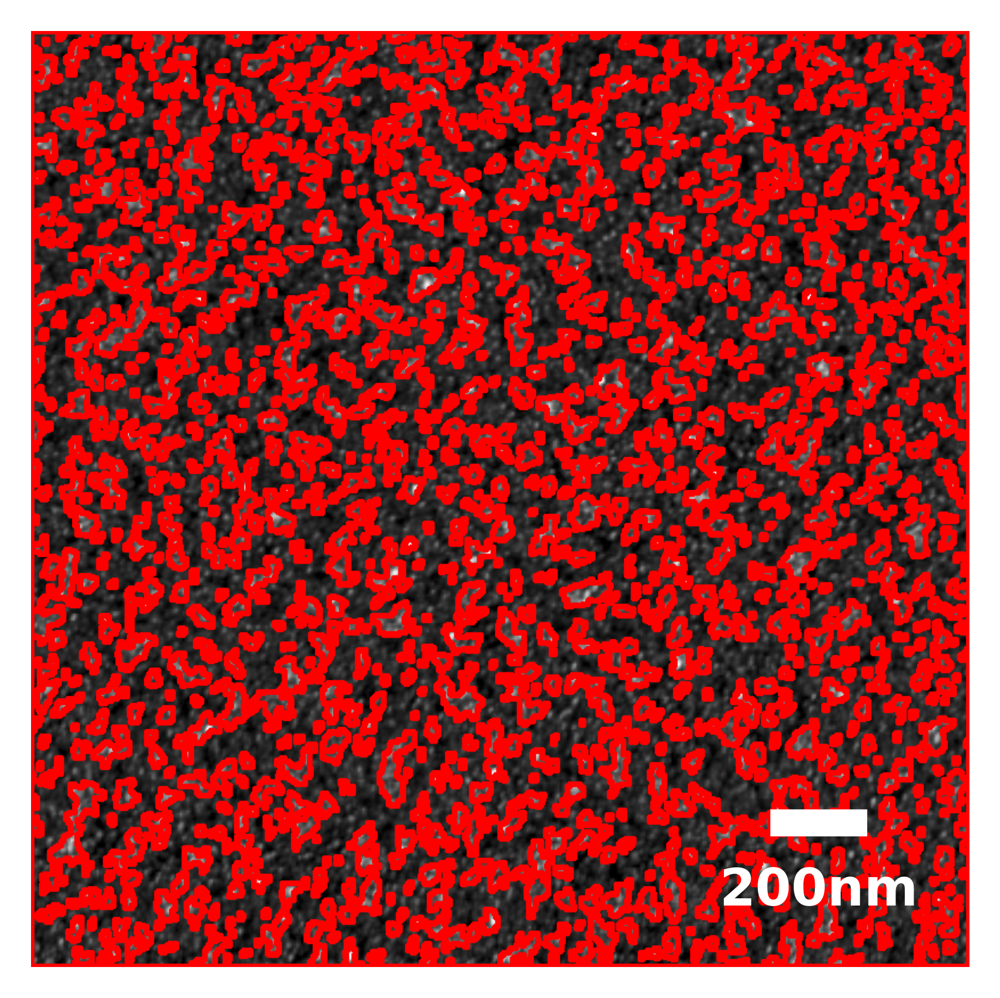

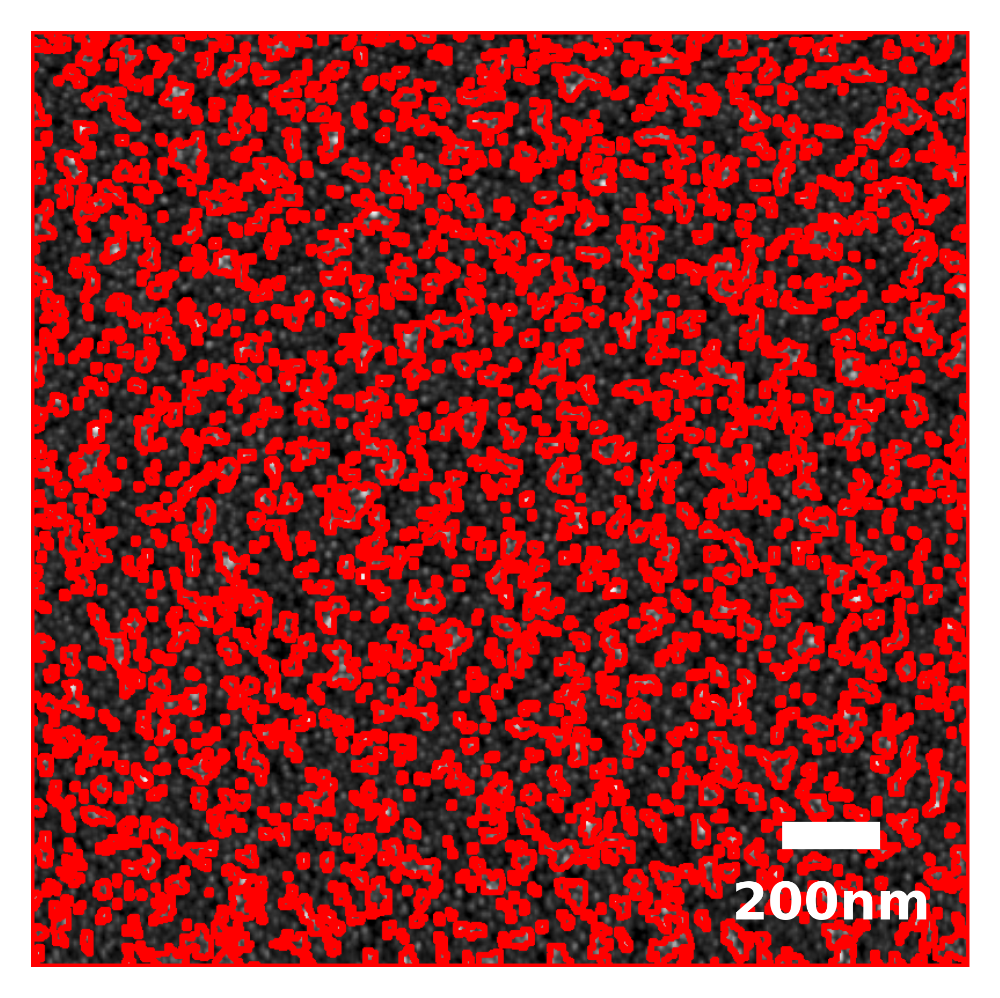

In [56]:
from matplotlib.patches import Rectangle
out_image_dir = save_dir / "images"
if not out_image_dir.exists():
    out_image_dir.mkdir()
for name, img in images_dict.items():
    plt.figure(dpi=600, frameon=False)
#     plt.figure()
#     plt.title(name)
    plt.imshow(img)
    rectangle = Rectangle((650, 685), 81, 20, linewidth=1, edgecolor='w', facecolor='w')
    ax = plt.gca()
    ax.add_patch(rectangle)
    rx, ry = rectangle.get_xy()
    cx = rx + rectangle.get_width()/2.0
    cy = ry + rectangle.get_height()/2.0 + 60
    ax.annotate("200nm", (cx, cy), color='white', weight='bold', fontsize=12, ha='center', va='center')
    plt.axis('off')
    plt.savefig(out_image_dir / (name + ".tif"))
    plt.show()

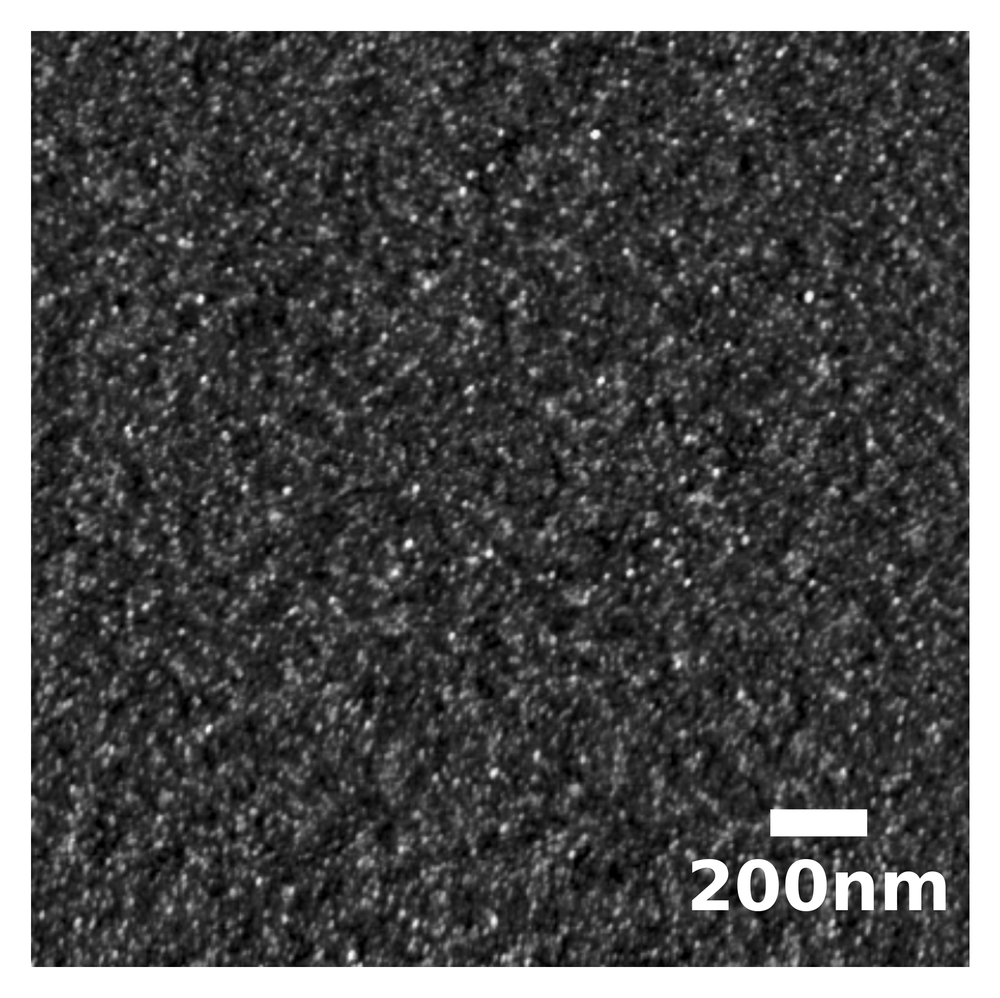

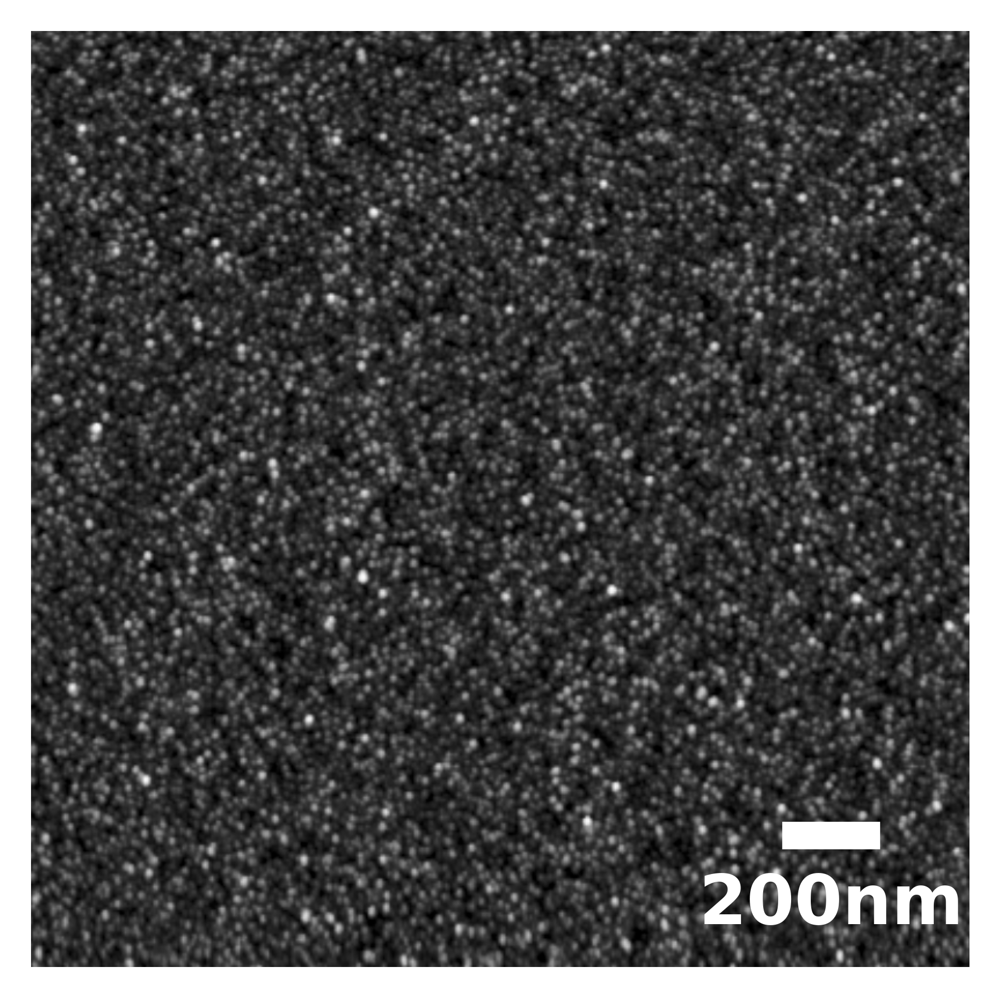

In [57]:

out_image_dir = save_dir / "images_with_marks"
if not out_image_dir.exists():
    out_image_dir.mkdir()
for p in image_dirs:
    img = cv.imread(str(p / "no_contrasted.tif"))
    plt.figure(dpi=600, frameon=False)
#     plt.figure()
#     plt.title(name)
    plt.imshow(img)
    rectangle = Rectangle((650, 685), 81, 20, linewidth=1, edgecolor='w', facecolor='w')
    ax = plt.gca()
    ax.add_patch(rectangle)
    rx, ry = rectangle.get_xy()
    cx = rx + rectangle.get_width()/2.0
    cy = ry + rectangle.get_height()/2.0 + 60
    ax.annotate("200nm", (cx, cy), color='white', weight='bold', fontsize=16, ha='center', va='center')
    plt.axis('off')
    plt.savefig(out_image_dir / (p.name + ".tif"))
    plt.show()

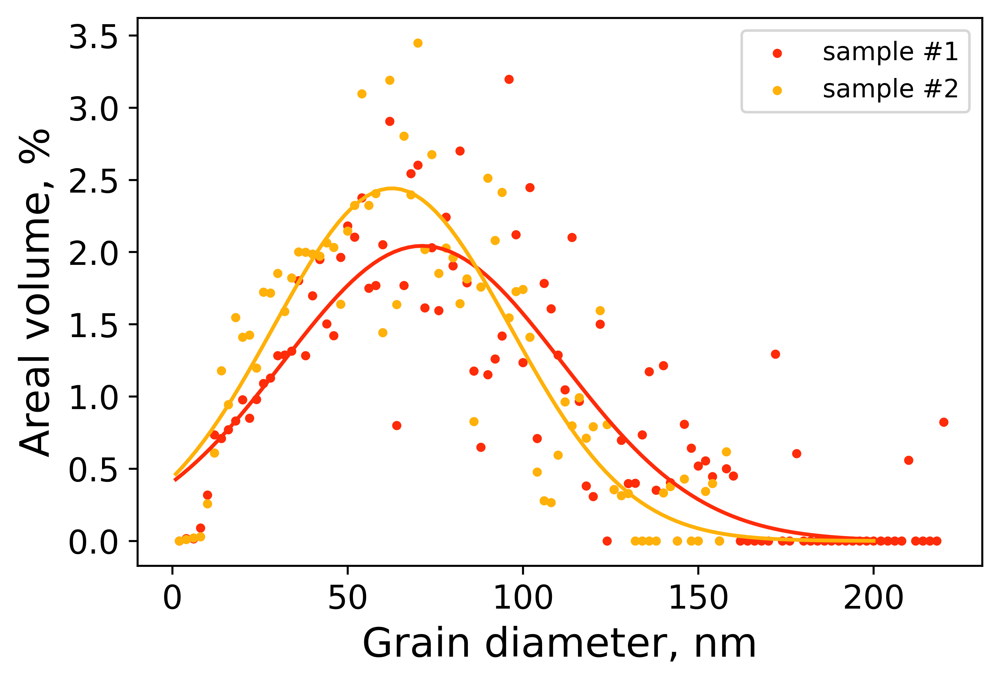

In [58]:
out_plot_areas = save_dir / "data_to_plot"
i = 0
plt.figure(dpi=600)
color_lib = ["#ff2c09", "#ffb109", "#1a09ff", "#09fff6"]
x_model = np.linspace(1, 200, 100)
if not out_plot_areas.exists():
    out_plot_areas.mkdir()
for name, data in plot_dict.items():
    mod = lmfit.models.GaussianModel()
    xdata = data[:,0]
    ydata = data[:,1]
    pars = mod.guess(ydata, x=xdata)
    out = mod.fit(ydata, pars, x=xdata)
    plt.scatter(data[:,0], data[:,1]*100, label=name, color=color_lib[i], s=7)
    plt.plot(x_model, out.eval(x=x_model)*100, color=color_lib[i])

    plt.ylabel("Areal volume, %", fontsize=16)
    plt.xlabel("Grain diameter, nm", fontsize=16)
    plt.xticks(fontsize=13)
    plt.yticks(fontsize=13)
    i +=1
    np.savetxt(out_plot_areas / (name + ".txt"), data)
plt.legend(loc="best")
plt.show()

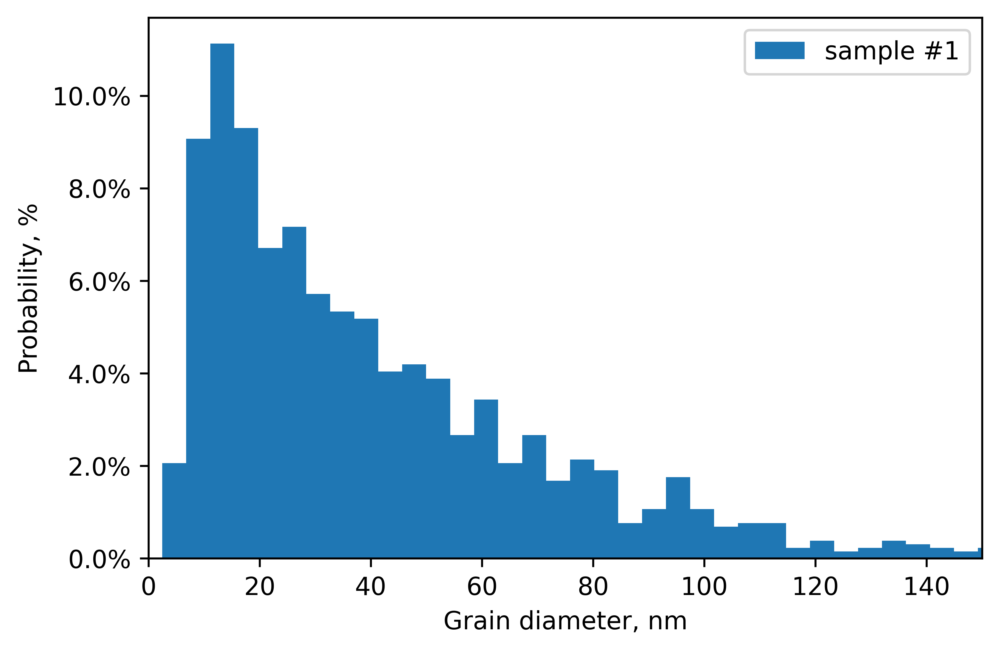

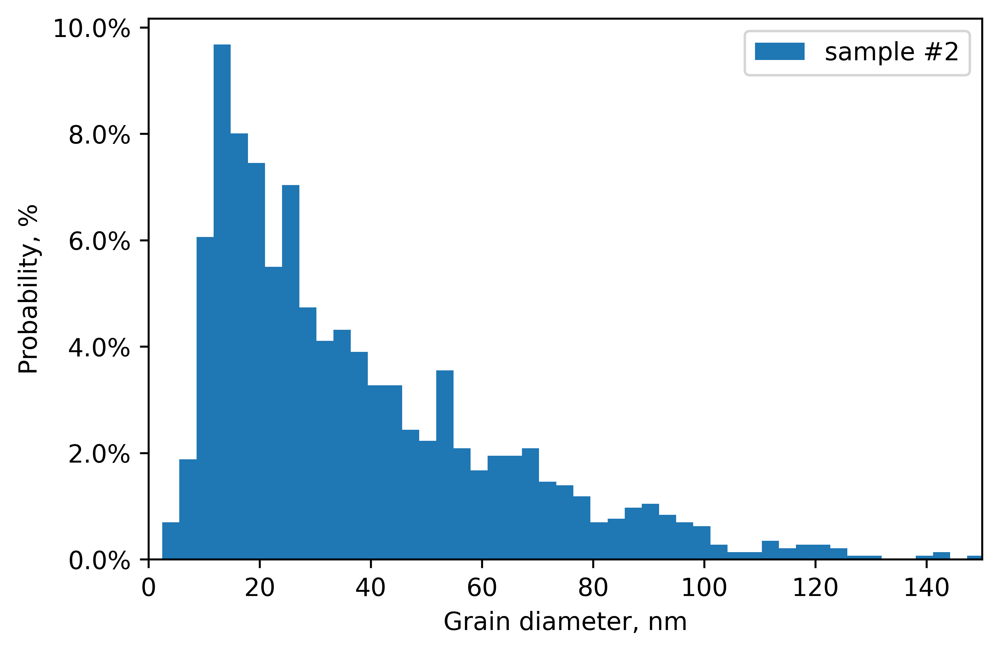

In [65]:
from matplotlib.ticker import PercentFormatter
out_plot_nm = save_dir / "data_sizes"
if not out_plot_nm.exists():
    out_plot_nm.mkdir()
for name, data in radius_dist.items():
    plt.figure(dpi = 600)
    plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
    plt.hist(data, label=name, bins=50, weights=np.ones(len(data)) / len(data))
    np.savetxt(out_plot_nm / (name + ".txt"), data)
    plt.xlim(0,150)
    plt.xlabel("Grain diameter, nm")
    plt.ylabel("Probability, %")
    plt.legend(loc="best") 
    

In [ ]:
from matplotlib.ticker import PercentFormatter
    plt.figure(dpi = 600)
for name, data in radius_dist.items():

    plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
    plt.hist(data, label=name, bins=50, weights=np.ones(len(data)) / len(data))
    plt.xlim(0,150)
    plt.xlabel("Grain diameter, nm")
    plt.ylabel("Probability, %")
    plt.legend(loc="best") 
    